In [1]:
import pandas as pd
import numpy as np

In [2]:
import matplotlib.pyplot as plt
# import seaborn as sns

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv('US_Accidents_Dec19.zip' , compression = 'zip' , usecols =['ID','Start_Time','Severity'])

In [5]:
df.head(1)

,ID,Severity,Start_Time
0,A-1,3,2016-02-08 05:46:00


In [6]:
df['Start_Time'] = pd.to_datetime(df['Start_Time'] )

In [8]:
# df.iloc[24: -1 , : ]

In [137]:
# df = df.iloc[24: -1 , : ]

In [7]:
data = df.groupby( df['Start_Time'].dt.date ).agg( {'ID' : 'count'}).rename( columns = {'ID' : 'Accident_Count'})

In [8]:
del df

In [9]:
data = data.iloc[24: -1 , : ]

In [10]:
data.head(1)

,Accident_Count
Start_Time,
2016-03-01,55


In [9]:
from matplotlib import dates

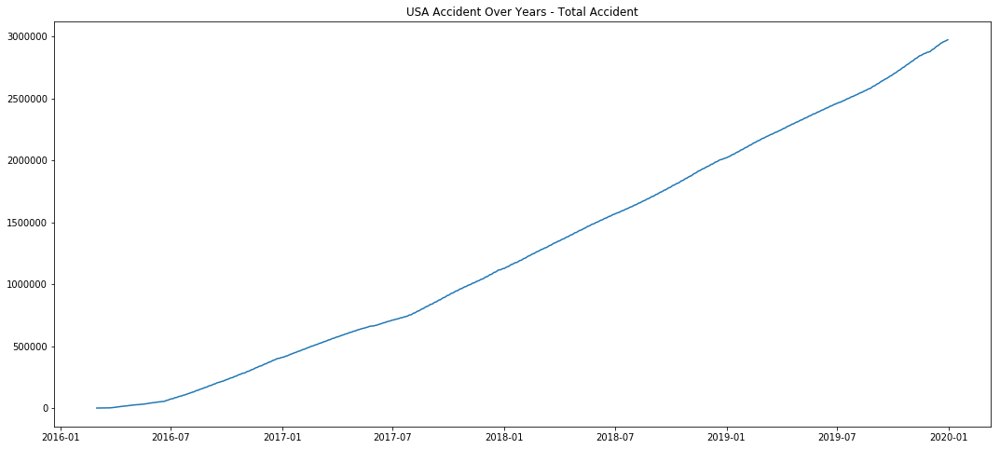

In [10]:
plt.figure( figsize = (18 , 8 ) )

plt.title('USA Accident Over Years - Total Accident')
plt.plot( data.expanding().sum() )
plt.savefig('static/forecasting/usa_accident_total.jpg')
plt.show()

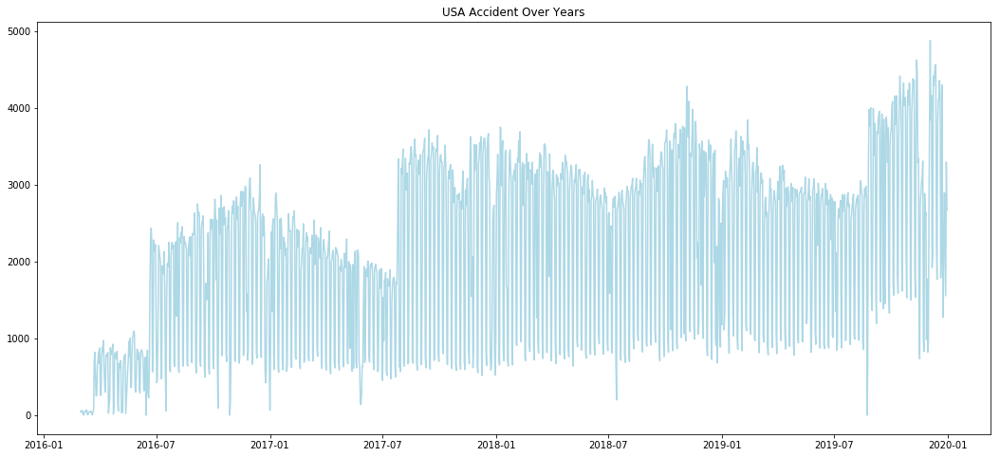

In [11]:
plt.figure( figsize = (18 , 8 ) )

plt.title('USA Accident Over Years')
plt.plot(data , color = 'lightblue')
# plt.plot(data.expanding().mean() , color = 'red' , ls = '--')
plt.savefig('static/forecasting/usa_accident.jpg')
plt.show()

 ## From the graph it is clear that our data is Additive model

In [ ]:
# ax.xaxis.set_major_locator( dates.WeekdayLocator(byweekday = 0 ) )
# ax.xaxis.set_major_formatter( dates.DateFormatter('%a-%B-%d' ) )

In [20]:
ind = pd.date_range( data.index[0] , data.index[-1] ) 
data_u = pd.DataFrame(   )
data_u['Start_Time'] =  ind
data_u['dummy'] = [0]*len(ind)  
data_u.set_index( 'Start_Time' , inplace = True )
data_u = data_u.join( data)
data_u = data_u['Accident_Count'].fillna(0)

In [17]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [21]:
result = seasonal_decompose( data_u , model ='additive')

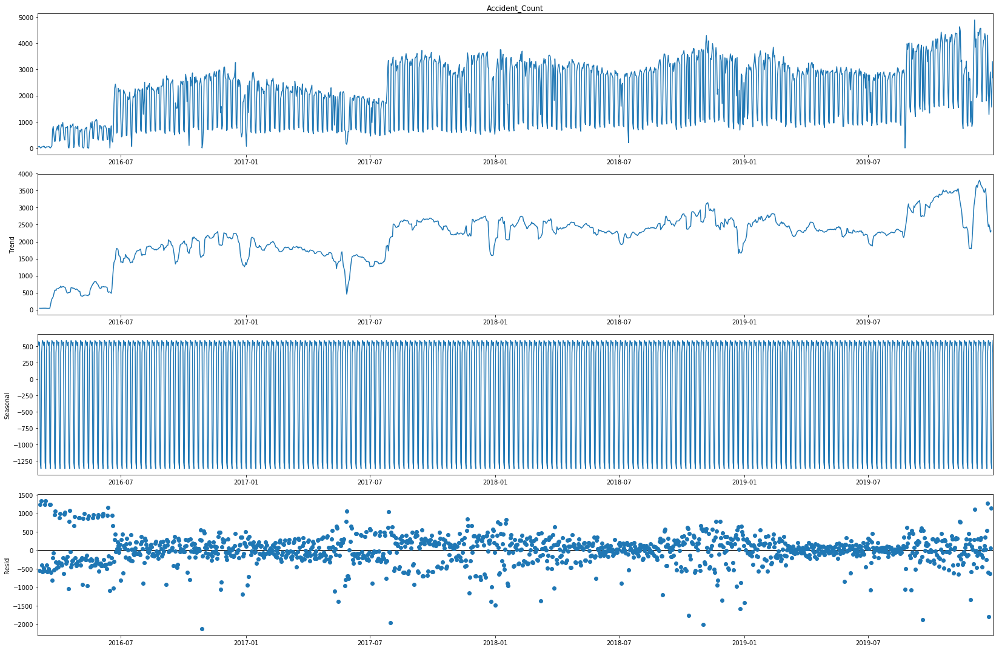

In [22]:
plt.rcParams['figure.figsize'] = (23 , 15 )
result.plot();
plt.savefig( 'static/forecasting/USA_ETA.jpg')

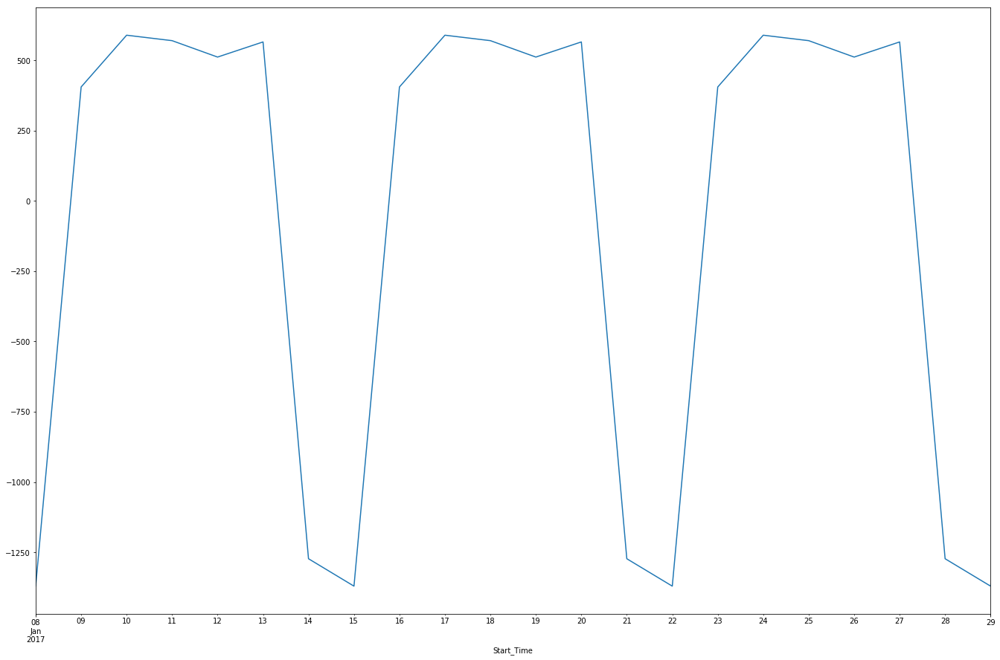

In [23]:
result.seasonal.plot( xlim = ('2017-01-08' , '2017-01-29') )
plt.savefig( 'static/forecasting/USA_seasonality.jpg')

## 7 days seasonality is found

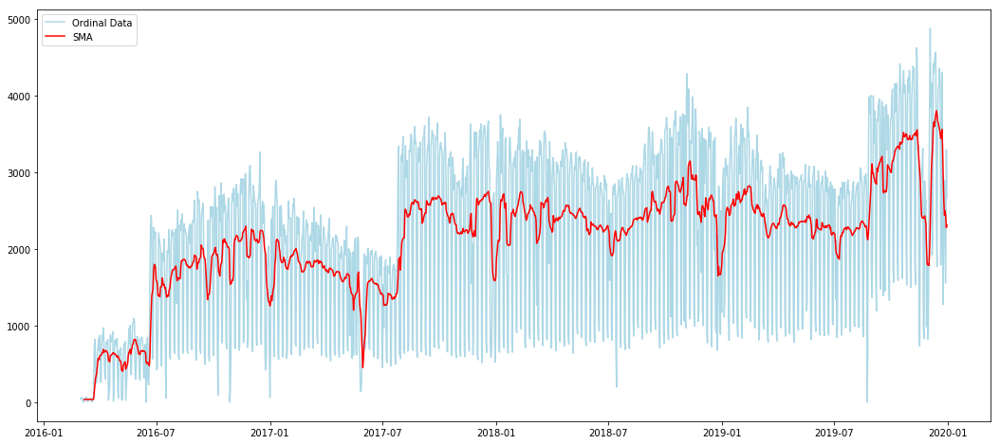

In [24]:
plt.figure(figsize = (18 , 8 ))

plt.plot( data['Accident_Count'] , color = 'lightblue' , label = 'Ordinal Data')
plt.plot( data.rolling( 7 ).mean()['Accident_Count'], color = 'red' , label = 'SMA')
plt.legend()
plt.savefig( 'static/forecasting/USA_SMA.jpg')
plt.show()

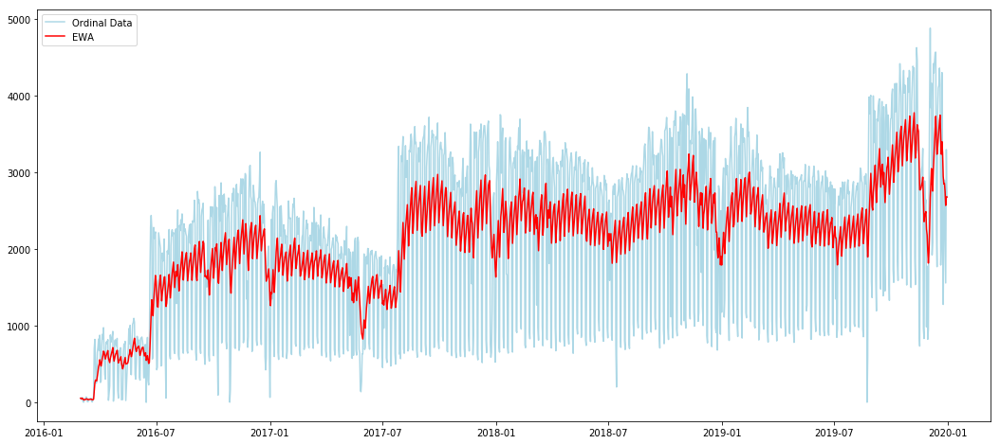

In [25]:
plt.figure(figsize = (18 , 8 ))

plt.plot( data['Accident_Count'] , color = 'lightblue' , label = 'Ordinal Data')
plt.plot( data['Accident_Count'].ewm(span = 12 ).mean() , color = 'red' , label = 'EWA')
plt.legend()
plt.savefig( 'static/forecasting/USA_EWM.jpg')
plt.show()

In [27]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

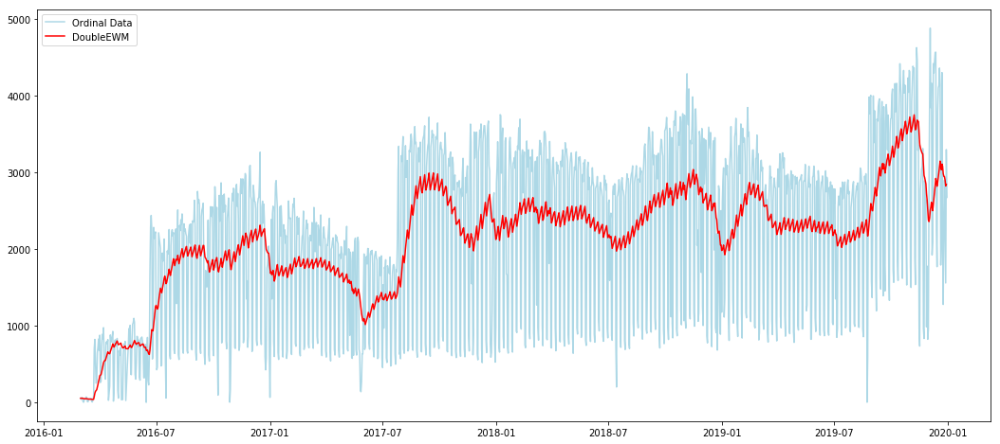

In [28]:
plt.figure(figsize = (18 , 8 ))

plt.plot( data['Accident_Count'] , color = 'lightblue' , label = 'Ordinal Data')
plt.plot( ExponentialSmoothing( data['Accident_Count'] , trend = 'add').fit().fittedvalues.shift(-1) , 
         color = 'red' , label = 'DoubleEWM')
plt.legend()
plt.savefig( 'static/forecasting/USA_DoubleEWM.jpg')
plt.show()



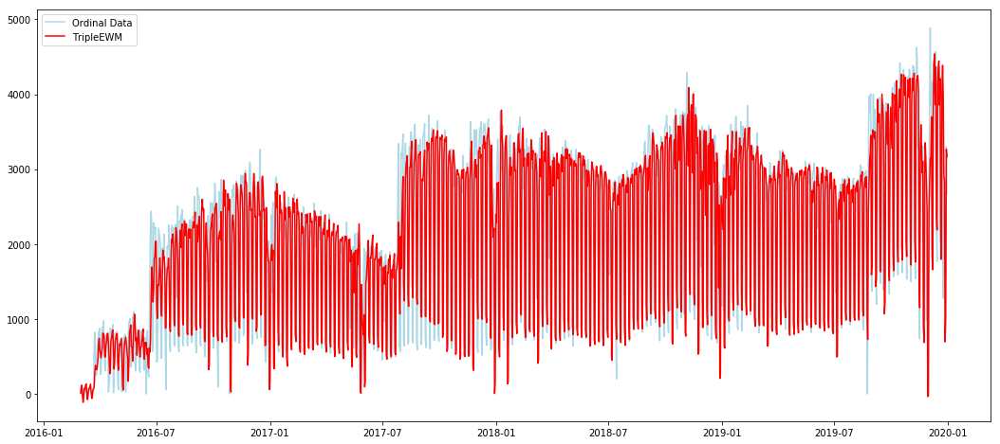

In [32]:
plt.figure(figsize = (18 , 8 ))

plt.plot( data['Accident_Count'] , color = 'lightblue' , label = 'Ordinal Data')
plt.plot( ExponentialSmoothing( data['Accident_Count'] , trend = 'add' 
                               , seasonal = 'add' , seasonal_periods = 7 ).fit().fittedvalues , 
         color = 'red' , label = 'TripleEWM')
plt.legend()
plt.savefig( 'static/forecasting/USA_TripleEWM.jpg')
plt.show()



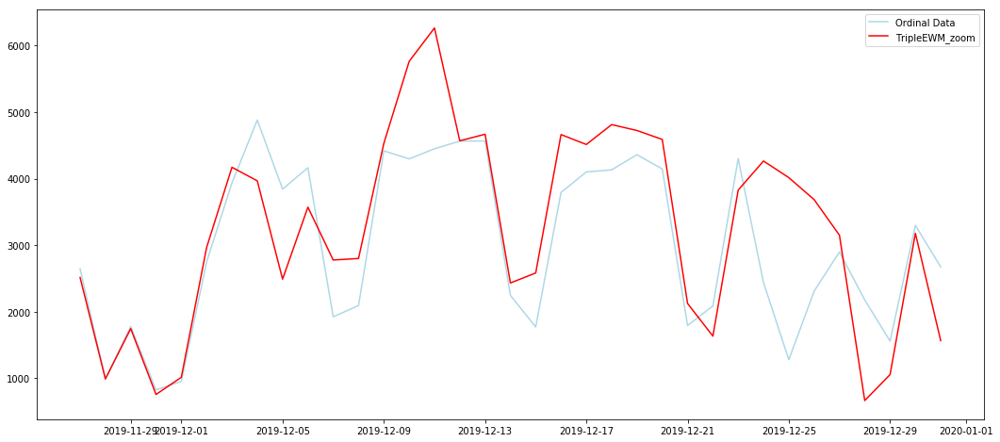

In [31]:
plt.figure(figsize = (18 , 8 ))

plt.plot( data['Accident_Count'].iloc[-35:] , color = 'lightblue' , label = 'Ordinal Data')
plt.plot( ExponentialSmoothing( data['Accident_Count'].iloc[-35:] , trend = 'add' 
                               , seasonal = 'add' , seasonal_periods = 7 ).fit().fittedvalues , 
         color = 'red' , label = 'TripleEWM_zoom')
plt.legend()
plt.savefig( 'static/forecasting/TripleEWM_zoom.jpg')
plt.show()


>>>  # Building Forecasting Model

In [498]:
model_name = []
model_param = []
model_rmse = []

# Holt winter's Model

In [500]:
train_data = data.iloc[ : -28  ]
test_data = data.iloc[ -28 : ]

In [501]:
fitted_model = ExponentialSmoothing( train_data['Accident_Count'] , trend = 'add' 
                               , seasonal = 'add' , seasonal_periods = 7 ).fit()
test_prediction = fitted_model.forecast( 28 )

In [502]:
from sklearn.metrics import mean_squared_error 

In [503]:
test_prediction.index = test_data.index

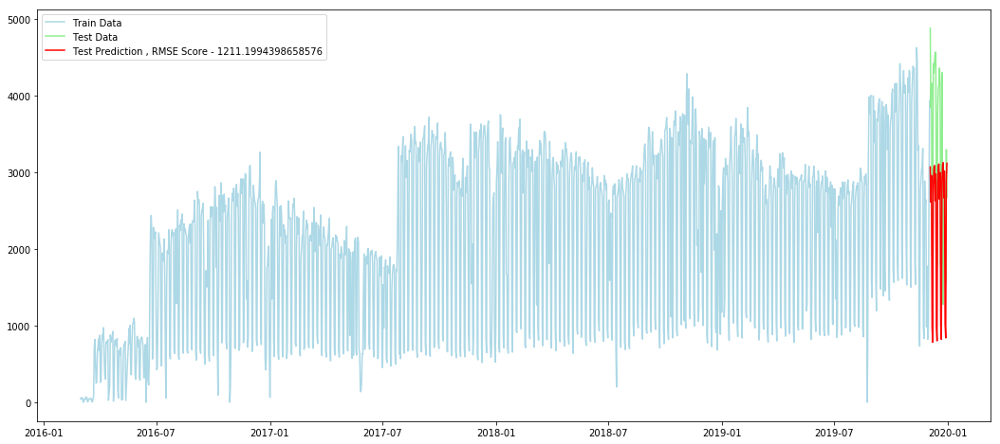

In [504]:
plt.figure(figsize = (18 , 8 ))

plt.plot( train_data , color = 'lightblue' , label = 'Train Data')
plt.plot( test_data , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/TripleEWM_model.jpg')
plt.show()

In [505]:
model_name.append( 'Holt Winter"s Model' )
model_param.append( fitted_model )
model_rmse.append( rmse )

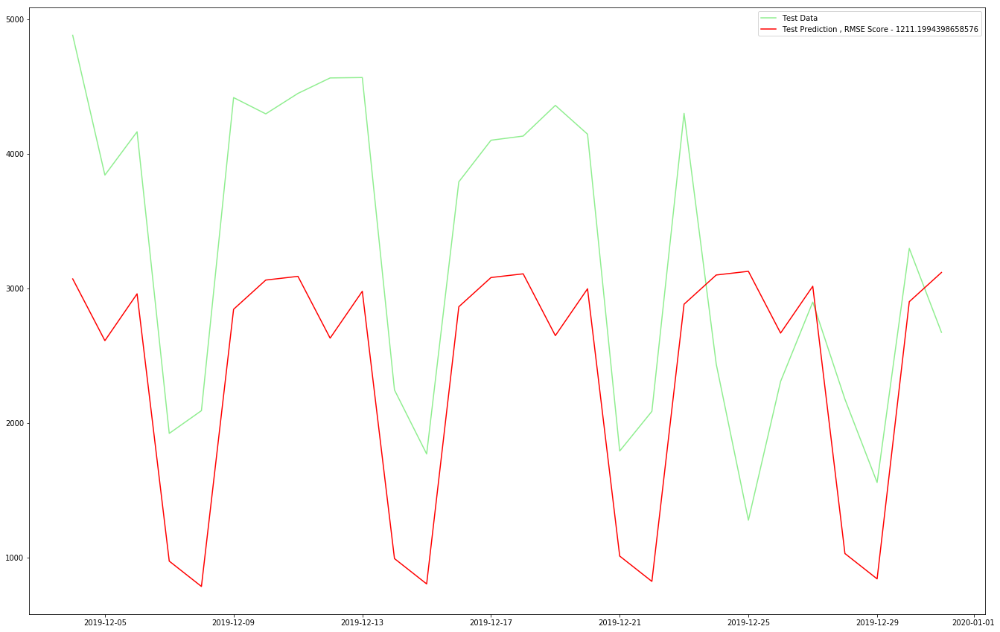

In [506]:
plt.plot( test_data , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/TripleEWM_model_zoom.jpg')
plt.show()

# ARIMA Model

In [336]:
from statsmodels.tsa.stattools import adfuller

def adf_test( series , title = ''):
    print( f'Augumented Dickey Fuller Test : {title}' )
    result = adfuller( series  , autolag = 'AIC')
    
    labels = ['ADF Test Statistics' , 'p-value' , '# lages used' , '# observation' ]
    out = pd.Series( result[0:4] , index = labels )
    
    for key , val in result[4].items():
        out[f'critical value {key}'] = val
    print( out.to_string())
    if result[1] < 0.05 :
        print('Strong evidence against null hypothesis')
        print('Reject null hypothesis')
        print('Data has no unit root and is stationary')
    else:
        print('Weak evidence against null hypothesis')
        print('Accept null hypothesis')
        print('Data has unit root and is non-stationary')
        
    

In [337]:
adf_test( data['Accident_Count']  , title = 'With out differncing')

Augumented Dickey Fuller Test : With out differncing
ADF Test Statistics      -3.353110
p-value                   0.012665
# lages used             22.000000
# observation          1374.000000
critical value 1%        -3.435118
critical value 5%        -2.863646
critical value 10%       -2.567891
Strong evidence against null hypothesis
Reject null hypothesis
Data has no unit root and is stationary


In [63]:
from pmdarima import auto_arima

In [491]:
best_fit = auto_arima( train_data['Accident_Count']  , start_p=0,
                      start_q=0, max_p=5, max_d=2, max_q=5, seasonal = False ,  freq = 'D' )
best_fit

ARIMA(maxiter=50, method='lbfgs', order=(5, 1, 2), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(0, 0, 0, 0),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

In [75]:
# auto_arima( data['Accident_Count']  , seasonal=False ).summary()

In [76]:
# from statsmodels.graphics.tsaplots import plot_acf , plot_pacf

In [84]:
from statsmodels.tsa.arima_model import ARIMA

In [507]:
model = ARIMA( train_data['Accident_Count'] , order = (5,1,2) )
result = model.fit()


In [508]:
start = len( train_data )
end = len(train_data) + len(test_data) - 1 

test_prediction = result.predict( start = start , end = end , typ = 'levels' )   # level for orginal data , linear for differenced data

In [509]:
test_prediction.index = test_data.index

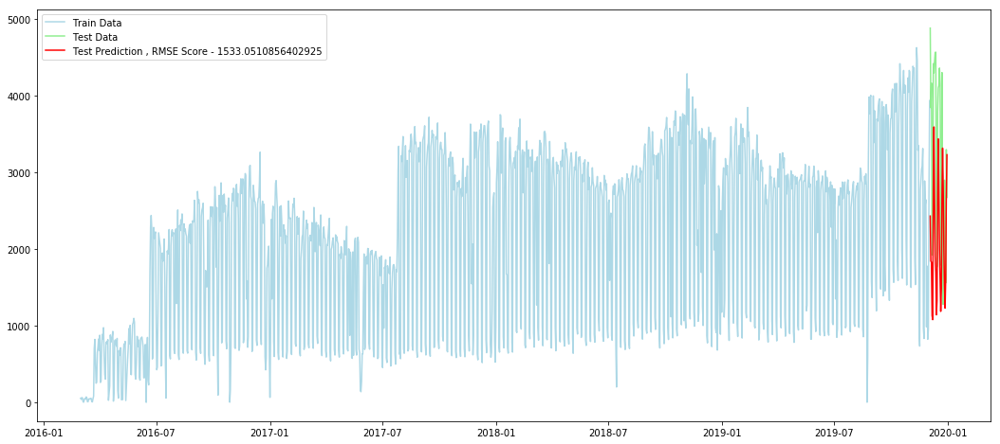

In [510]:
plt.figure(figsize = (18 , 8 ))

plt.plot( train_data , color = 'lightblue' , label = 'Train Data')
plt.plot( test_data , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/ARIMA_model.jpg')
plt.show()

In [511]:
model_name.append( 'ARIMA Model' )
model_param.append( model )
model_rmse.append( rmse )

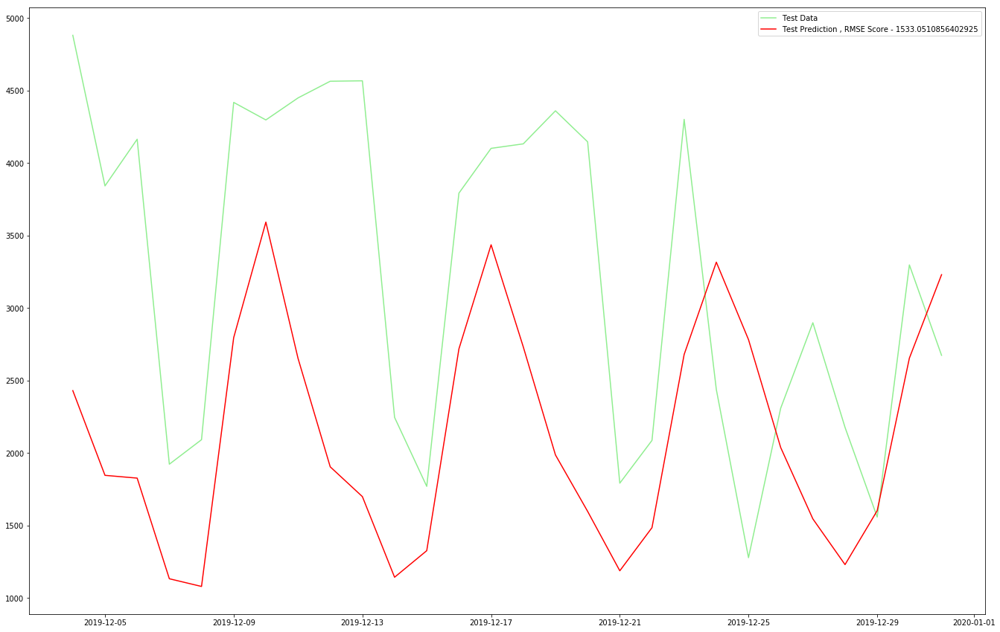

In [512]:
plt.plot( test_data , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/ARIMA_model_zoom.jpg')
plt.show()

# SARIMA Model

In [95]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [513]:
best_fit = auto_arima( train_data['Accident_Count'] , seasonal = True , m = 7   , freq = 'D')

In [514]:
best_fit

ARIMA(maxiter=50, method='lbfgs', order=(1, 1, 2), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(1, 0, 1, 7),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

In [522]:
model = SARIMAX( train_data['Accident_Count'] , order = (1,1,2) , seasonal_order = (1,0,1,7)
                 , enforce_invertibility = False )
result = model.fit()


In [523]:
start = len( train_data )
end = len(train_data) + len(test_data) - 1 

test_prediction = result.predict( start = start , end = end , typ = 'levels' )   # level for orginal data , linear for differenced data

In [524]:
test_prediction.index = test_data.index

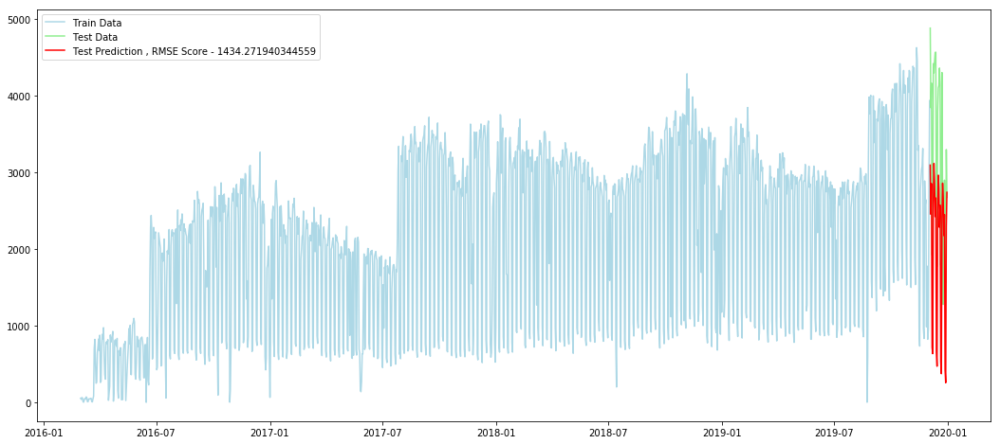

In [525]:
plt.figure(figsize = (18 , 8 ))

plt.plot( train_data , color = 'lightblue' , label = 'Train Data')
plt.plot( test_data , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/SARIMA_model.jpg')
plt.show()

In [520]:
model_name.append( 'SARIMA Model' )
model_param.append( model )
model_rmse.append( rmse )

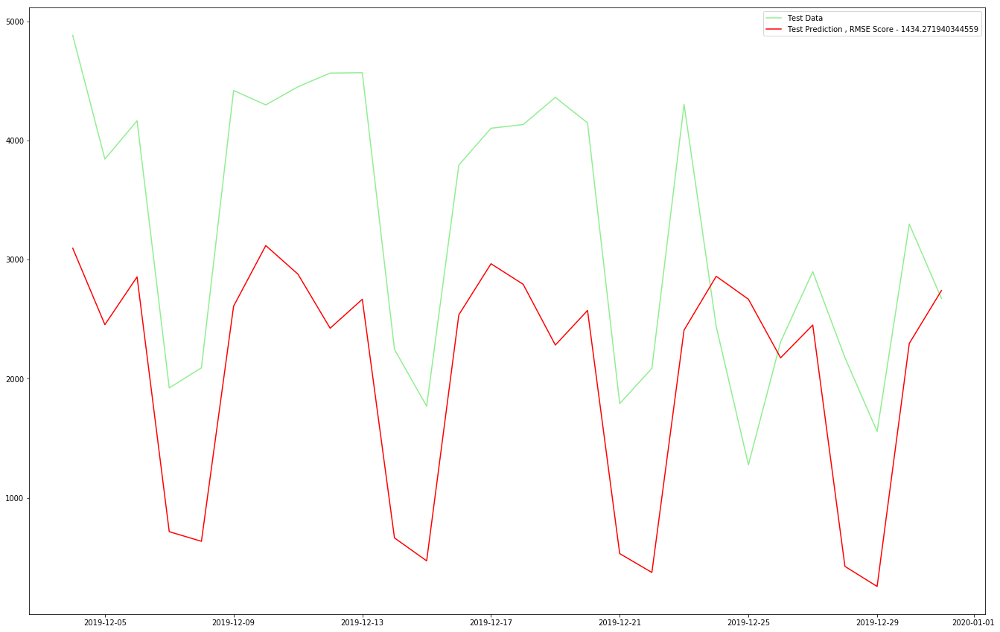

In [526]:
plt.plot( test_data , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/SARIMA_model_zoom.jpg')
plt.show()

# SARIMAX Model

In [527]:
data.reset_index(inplace = True )

In [528]:
data['weekday'] = pd.to_datetime( data['Start_Time'] ).dt.weekday
data['weekday1'] = data['weekday'].apply( lambda x : 0 if x in [5 , 6 ] else 1 )

In [529]:
data.set_index( 'Start_Time' , inplace = True )

In [530]:
data.head(2)

,Accident_Count,weekday,weekday1
Start_Time,,,
2016-03-01,55,1,1
2016-03-02,40,2,1


In [531]:
train_data = data.iloc[ : -28  ]
test_data = data.iloc[ -28 : ]

In [532]:
best_fit = auto_arima( train_data['Accident_Count'] , seasonal = True , m = 7 , exogenous = train_data[['weekday']]  , freq = 'D')
best_fit

ARIMA(maxiter=50, method='lbfgs', order=(1, 1, 2), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(1, 0, 1, 7),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

In [533]:
best_fit = auto_arima( train_data['Accident_Count'] , seasonal = True , m = 7 , exogenous = train_data[['weekday1']] , freq = 'D' )
best_fit

ARIMA(maxiter=50, method='lbfgs', order=(2, 1, 2), out_of_sample_size=0,
      scoring='mse', scoring_args=None, seasonal_order=(1, 0, 2, 7),
      start_params=None, suppress_warnings=False, trend=None,
      with_intercept=True)

- weekday

In [534]:
model = SARIMAX( train_data['Accident_Count'] , order = (1,1,2) , seasonal_order = (1,0,1,7),
               exog = train_data[['weekday']]  , enforce_invertibility = False )
result = model.fit()


In [535]:
start = len( train_data )
end = len(train_data) + len(test_data) - 1 

test_prediction = result.predict( start = start , end = end , exog = test_data[['weekday']]  )   # level for orginal data , linear for differenced data

In [536]:
test_prediction.index = test_data.index

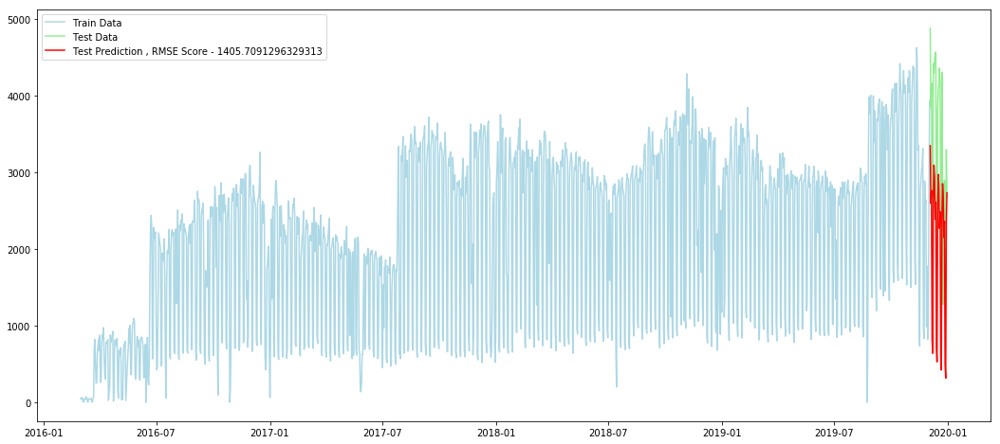

In [537]:
plt.figure(figsize = (18 , 8 ))

plt.plot( train_data['Accident_Count'] , color = 'lightblue' , label = 'Train Data')
plt.plot( test_data['Accident_Count'] , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data['Accident_Count'] , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/SARIMAX_model.jpg')
plt.show()

In [538]:
model_name.append( 'SARIMAX Model_ex1' )
model_param.append( model )
model_rmse.append( rmse )

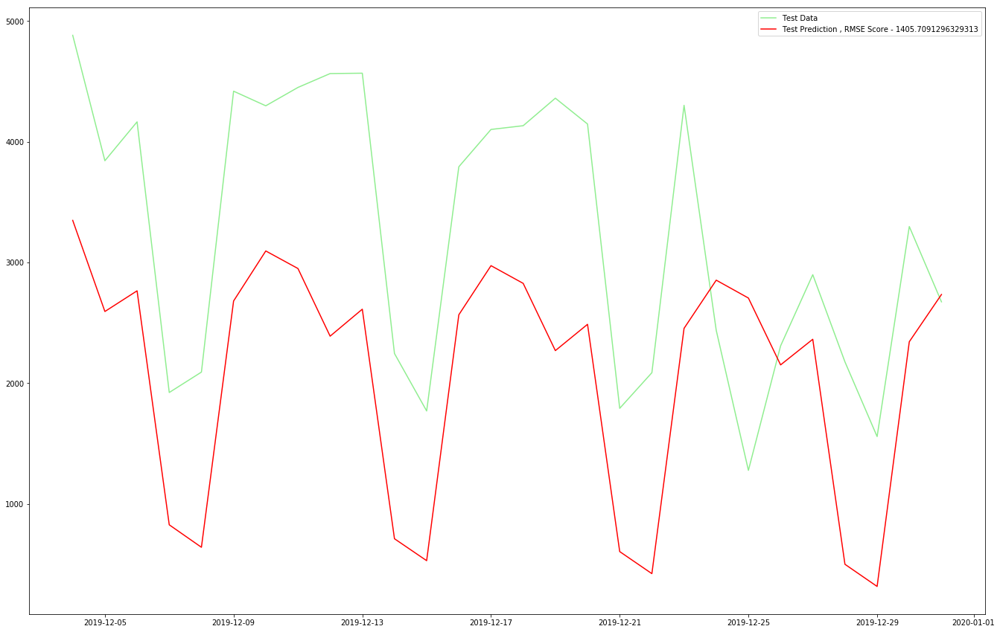

In [539]:
plt.plot( test_data['Accident_Count'] , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data['Accident_Count'] , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/SARIMAX_model_zoom.jpg')
plt.show()

- weekday1

In [540]:
model = SARIMAX( train_data['Accident_Count'] , order = (2,1,2) , seasonal_order = (1,0,2,7),
               exog = train_data[['weekday1']]  , enforce_invertibility = False )
result = model.fit()


In [541]:
start = len( train_data )
end = len(train_data) + len(test_data) - 1 

test_prediction = result.predict( start = start , end = end , exog = test_data[['weekday1']]  )   # level for orginal data , linear for differenced data

In [542]:
test_prediction.index = test_data.index

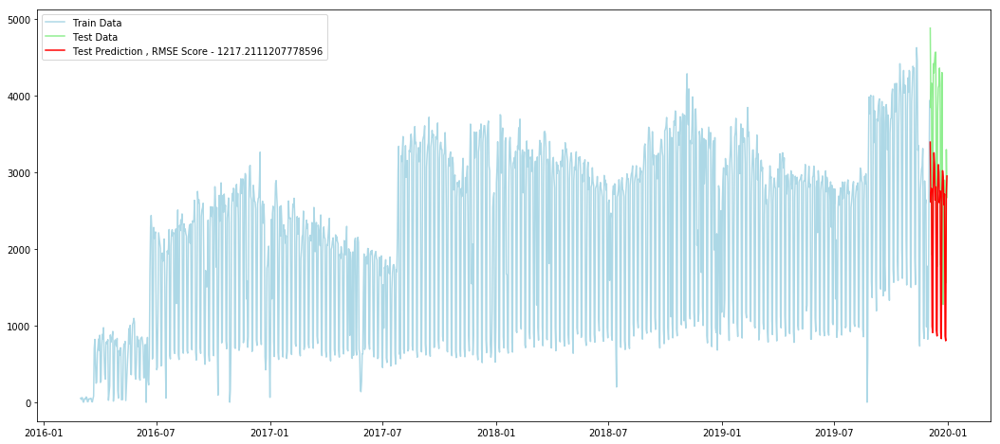

In [543]:
plt.figure(figsize = (18 , 8 ))

plt.plot( train_data['Accident_Count'] , color = 'lightblue' , label = 'Train Data')
plt.plot( test_data['Accident_Count'] , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data['Accident_Count'] , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/SARIMAX_model1.jpg')
plt.show()

In [544]:
model_name.append( 'SARIMAX Model_ex2' )
model_param.append( model )
model_rmse.append( rmse )

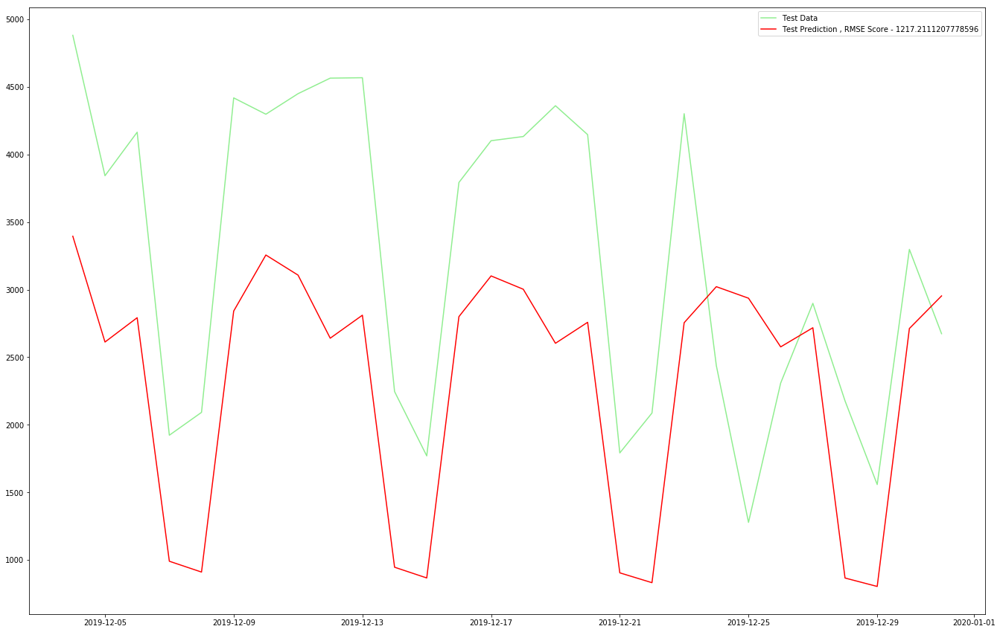

In [545]:
plt.plot( test_data['Accident_Count'] , color = 'lightgreen' , label = 'Test Data')

rmse = np.sqrt( mean_squared_error( test_data['Accident_Count'] , test_prediction ) )
plt.plot( test_prediction , color = 'red' , label = 'Test Prediction , RMSE Score - {}'.format( rmse ) )
plt.legend()
plt.savefig( 'static/forecasting/SARIMAX_model_zoom1.jpg')
plt.show()

# Model Comparision

In [546]:
model_comparision = pd.DataFrame( list( zip( model_name , model_param , model_rmse ) ) 
             , columns = ['model_name' , 'model_param' , 'model_rmse'])
model_comparision

,model_name,model_param,model_rmse
0,"Holt Winter""s Model",<statsmodels.tsa.holtwinters.HoltWintersResult...,1211.199440
1,ARIMA Model,<statsmodels.tsa.arima_model.ARIMA object at 0...,1533.051086
2,SARIMA Model,<statsmodels.tsa.statespace.sarimax.SARIMAX ob...,1434.271940
3,SARIMAX Model_ex1,<statsmodels.tsa.statespace.sarimax.SARIMAX ob...,1405.709130
4,SARIMAX Model_ex2,<statsmodels.tsa.statespace.sarimax.SARIMAX ob...,1217.211121


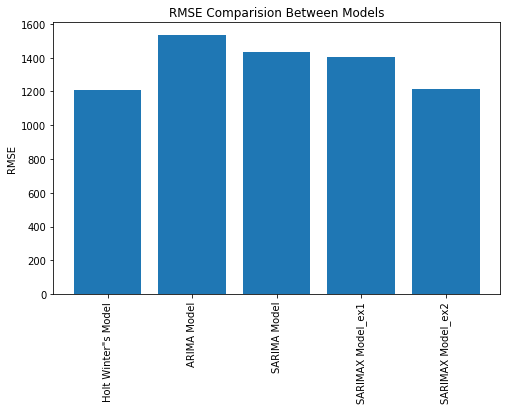

In [547]:
plt.figure( figsize = (8,5))
plt.bar( x = model_comparision['model_name'] , height = model_comparision['model_rmse'] )
plt.ylabel('RMSE')
plt.title('RMSE Comparision Between Models')
plt.xticks(rotation = 90 )
plt.savefig( 'static/forecasting/RMSE_Comparision_ML.jpg')
plt.show()

## From the above we are selecting the SARIMA model 

In [593]:
model = SARIMAX( data['Accident_Count'] , order = (2,1,2) , seasonal_order = (1,0,2,7),
               exog = data[['weekday1']]  , enforce_invertibility = False )
result = model.fit()

from datetime import timedelta

index = pd.date_range( data.index[-1]+ timedelta(days = 1) ,  data.index[-1] + timedelta(days = 28)  )

exog_prediction = pd.to_datetime( pd.Series(index) ).dt.weekday.apply( lambda x : 0 if x in [5 , 6 ] else 1 )

prediction = result.forecast( 28 , exog = exog_prediction )

prediction.index = index 

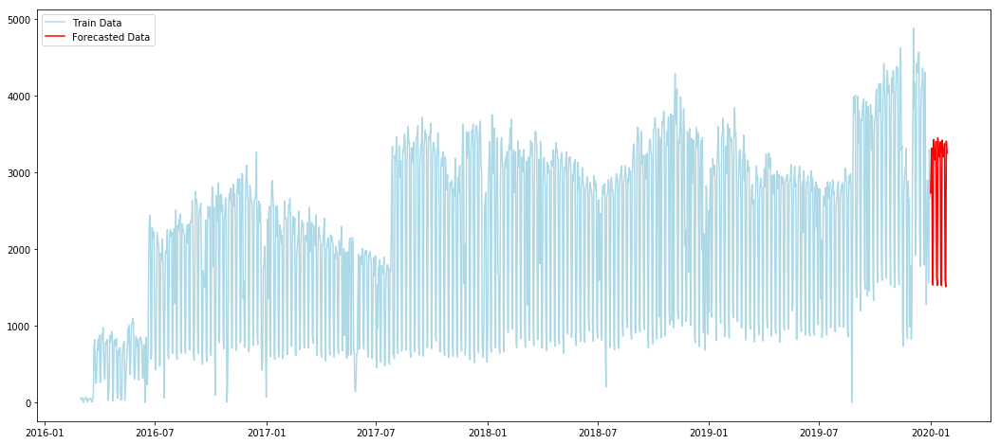

In [594]:
plt.figure(figsize = (18 , 8 ))

plt.plot( data['Accident_Count'] , color = 'lightblue' , label = 'Train Data')
plt.plot( prediction, color = 'red' , label = 'Forecasted Data')
plt.legend()
plt.savefig( 'static/forecasting/finalmodel_forecast.jpg')
plt.show()

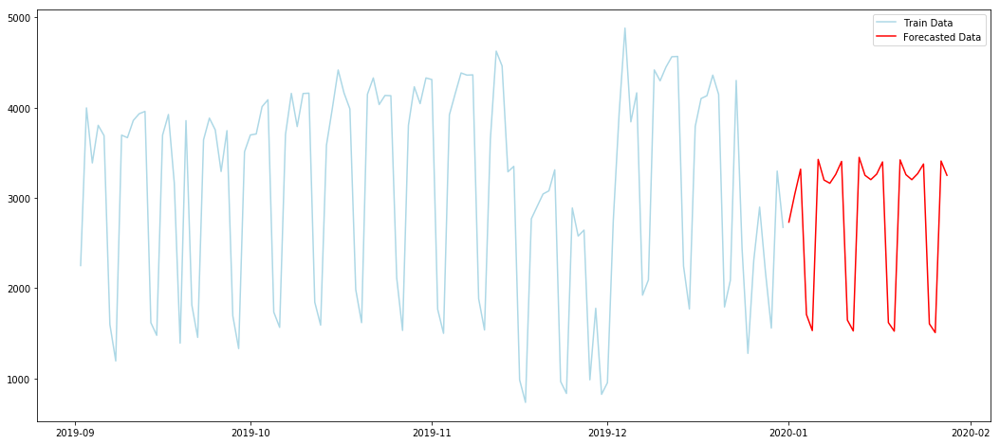

In [595]:
plt.figure(figsize = (18 , 8 ))

plt.plot( data['Accident_Count'].iloc[-121:] , color = 'lightblue' , label = 'Train Data')
plt.plot( prediction, color = 'red' , label = 'Forecasted Data')
plt.legend()
plt.savefig( 'static/forecasting/finalmodel_forecast_zoom.jpg')
plt.show()

In [597]:
from plotly.offline import download_plotlyjs , init_notebook_mode , plot , iplot 
import plotly.graph_objs as go

In [600]:
data.head(1)

,Accident_Count,weekday,weekday1
Start_Time,,,
2016-03-01,55,1,1


In [638]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = data.index ,y = data.Accident_Count))
fig.add_trace(go.Scatter(x = index ,y = prediction , line=dict(color='firebrick', width=4) ))
# fig.update_xaxes(range=[ data.index[-200], index[-1] ] )
fig.update_xaxes(rangeslider_visible=True,
                  rangeselector=dict( buttons=list(
                      [
                          dict(count=1, label="Future Predictions", step="year", stepmode="todate"),
                          dict(count=2, label="last 2 months", step="month", stepmode="backward"),
                          dict(count=4, label="last 4 months", step="month", stepmode="backward"),
                          dict(count=1, label="last 1 year", step="year", stepmode="backward") ,
                          dict(count=2, label="last 2 year", step="year", stepmode="backward"),
                          dict(step="all")
                      ]
                  )))
fig

In [641]:
plot(fig, filename = 'templates/AccidentForecasting.html')

'templates/AccidentForecasting.html'

>>>  ## Deep Learning

In [10]:
data.head(2)

,Accident_Count
Start_Time,
2016-03-01,55
2016-03-02,40


In [14]:
from sklearn.preprocessing import MinMaxScaler

m = MinMaxScaler()

In [13]:
n_input = 28 
n_features = 1 

In [17]:
from keras.preprocessing.sequence import TimeseriesGenerator


In [17]:
train_data = data.iloc[ : -28  ]
test_data = data.iloc[ -28 : ]


scaled_train_data = m.fit_transform( train_data )




train_generator = TimeseriesGenerator( scaled_train_data , scaled_train_data ,  length = n_input , batch_size = n_features )

In [11]:
from keras.models import Sequential
from keras.layers import Dense , LSTM

Using TensorFlow backend.


In [15]:
model = Sequential()

model.add( LSTM( 150 , activation = 'relu' , input_shape = (n_input , n_features) ) )
model.add( Dense( 1 ) )
model.compile( optimizer = 'adam' , loss = 'mse' )

model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 150)               91200     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 151       
Total params: 91,351
Trainable params: 91,351
Non-trainable params: 0
_________________________________________________________________


In [39]:
model.fit_generator( train_generator , epochs = 25 )


Epoch 1/25
1341/1341 [==============================] - 91s 68ms/step - loss: 0.0442
Epoch 2/25
1341/1341 [==============================] - 79s 59ms/step - loss: 0.0164
Epoch 3/25
1341/1341 [==============================] - 76s 57ms/step - loss: 0.0175
Epoch 4/25
1341/1341 [==============================] - 78s 58ms/step - loss: 0.0147
Epoch 5/25
1341/1341 [==============================] - 71s 53ms/step - loss: 0.0137
Epoch 6/25
1341/1341 [==============================] - 70s 52ms/step - loss: 0.0137
Epoch 7/25
1341/1341 [==============================] - 70s 52ms/step - loss: 0.0138
Epoch 8/25
1341/1341 [==============================] - 69s 52ms/step - loss: 0.0124
Epoch 9/25
1341/1341 [==============================] - 68s 51ms/step - loss: 0.0103
Epoch 10/25
1341/1341 [==============================] - 69s 52ms/step - loss: 0.0095
Epoch 11/25
1341/1341 [==============================] - 66s 49ms/step - loss: 0.0083
Epoch 12/25
1341/1341 [==============================] - 65s 4

In [43]:
loss = model.history.history['loss']
epochs = [ i+1 for i in range(len(loss)) ]

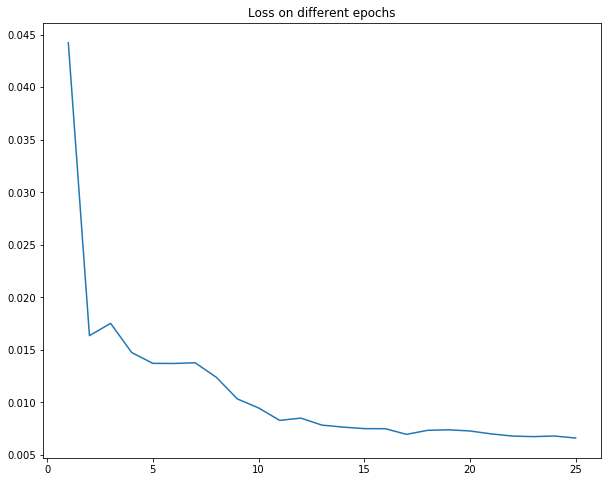

In [46]:
plt.figure( figsize = ( 10 , 8 ) )
plt.title( 'Loss on different epochs')
plt.plot(   epochs , loss )

In [68]:
test_predictions = []

first_batch_eval = scaled_train_data[ -n_input : ]

current_batch = first_batch_eval.reshape( ( 1, n_input , n_features))

for i in range(len(test_data)):
    
    curr_pred = model.predict( current_batch )[0]
    test_predictions.append( curr_pred )
    current_batch = np.append( current_batch[:,1:,:] , [[curr_pred]] , axis = 1 )

test_predictions = m.inverse_transform( test_predictions ).reshape(-1)

test_data['Prediction'] = test_predictions

In [78]:
from sklearn.metrics import mean_squared_error

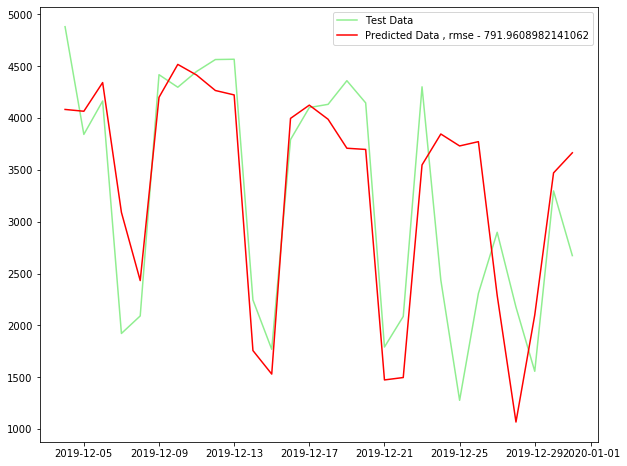

In [80]:
plt.figure( figsize = (10 , 8 ))

rmse = np.sqrt( mean_squared_error( test_data['Accident_Count'] , test_data['Prediction'] ) )
plt.plot( test_data['Accident_Count'] , color = 'lightgreen' , label = 'Test Data')
plt.plot( test_data['Prediction']  , color = 'red' , label = 'Predicted Data , rmse - {}'.format(rmse) )
plt.legend()

plt.show()

In [18]:
scale_data = m.fit_transform( data )

data_generator = TimeseriesGenerator( scale_data , scale_data ,  length = n_input , batch_size = n_features )

In [19]:
model.fit_generator( data_generator , epochs = 25 )


Epoch 1/25
1369/1369 [==============================] - 71s 52ms/step - loss: 0.0462
Epoch 2/25
1369/1369 [==============================] - 72s 52ms/step - loss: 0.0211
Epoch 3/25
1369/1369 [==============================] - 71s 52ms/step - loss: 0.0146
Epoch 4/25
1369/1369 [==============================] - 73s 53ms/step - loss: 0.0137
Epoch 5/25
1369/1369 [==============================] - 71s 52ms/step - loss: 0.0126
Epoch 6/25
1369/1369 [==============================] - 74s 54ms/step - loss: 0.0125
Epoch 7/25
1369/1369 [==============================] - 75s 55ms/step - loss: 0.0111
Epoch 8/25
1369/1369 [==============================] - 74s 54ms/step - loss: 0.0100
Epoch 9/25
1369/1369 [==============================] - 73s 53ms/step - loss: 0.0090
Epoch 10/25
1369/1369 [==============================] - 70s 51ms/step - loss: 0.0090
Epoch 11/25
1369/1369 [==============================] - 71s 52ms/step - loss: 0.0088
Epoch 12/25
1369/1369 [==============================] - 69s 5

In [21]:
model_json = model.to_json()
with open("AccidentForecastingModel.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
model.save_weights("AccidentForecastingModel.h5")
print("Saved model to disk")

Saved model to disk


In [23]:
test_predictions = []

first_batch_eval = scale_data[ -n_input : ]

current_batch = first_batch_eval.reshape( ( 1, n_input , n_features))

for i in range(28):
    
    curr_pred = model.predict( current_batch )[0]
    test_predictions.append( curr_pred )
    current_batch = np.append( current_batch[:,1:,:] , [[curr_pred]] , axis = 1 )

test_predictions = m.inverse_transform( test_predictions ).reshape(-1)


In [26]:
index = pd.date_range( data.index[-1] , periods = 28 , freq = 'D')
test_predictions = pd.Series( test_predictions , index )

(737397.0, 737451.0)

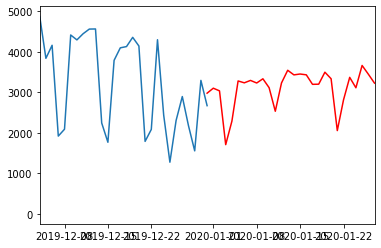

In [30]:
plt.plot( data )
plt.plot(test_predictions , color = 'red')
plt.xlim( data.index[-28] , test_predictions.index[-1] )

In [11]:
from plotly.offline import download_plotlyjs , init_notebook_mode , plot , iplot 
import plotly.graph_objs as go

In [38]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = data.index ,y = data.Accident_Count))
fig.add_trace(go.Scatter(x = index ,y = test_predictions , line=dict(color='firebrick', width=4) ))
# fig.update_xaxes(range=[ data.index[-200], index[-1] ] )
fig.update_xaxes(rangeslider_visible=True,
                  rangeselector=dict( buttons=list(
                      [
                          dict(count=1, label="Future Predictions", step="year", stepmode="todate"),
                          dict(count=2, label="last 2 months", step="month", stepmode="backward"),
                          dict(count=4, label="last 4 months", step="month", stepmode="backward"),
                          dict(count=1, label="last 1 year", step="year", stepmode="backward") ,
                          dict(count=2, label="last 2 year", step="year", stepmode="backward"),
                          dict(step="all")
                      ]
                  )))
fig

In [39]:
plot(fig, filename = 'templates/AccidentForecasting_DL.html')

'templates/AccidentForecasting_DL.html'

In [12]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = data.index ,y = data.Accident_Count))

fig.update_xaxes(rangeslider_visible=True,
                  rangeselector=dict( buttons=list(
                      [
                          dict(count=2, label="last 2 months", step="month", stepmode="backward"),
                          dict(count=4, label="last 4 months", step="month", stepmode="backward"),
                          dict(count=1, label="last 1 year", step="year", stepmode="backward") ,
                          dict(count=2, label="last 2 year", step="year", stepmode="backward"),
                          dict(step="all")
                      ]
                  )))
fig

In [13]:
plot(fig, filename = 'templates/AccidentCount.html')

'templates/AccidentCount.html'